<a href="https://colab.research.google.com/github/MMohsinM/Embedded-Project/blob/master/Mosaic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Libraries


##### Initialization

In [7]:
!pip install spafe # This library is used to plot GFCC
!pip install librosa --upgrade

     |████████████████████████████████| 81kB 7.8MB/s 
     |████████████████████████████████| 184kB 13.6MB/s 
     |████████████████████████████████| 61kB 8.5MB/s 
  Created wheel for librosa: filename=librosa-0.8.0-cp36-none-any.whl size=201375 sha256=90fa5a17748e9ccde7b467077a711be10dbfb1bd4c9154c895818b7687b6eac0
  Stored in directory: /root/.cache/pip/wheels/ee/10/1e/382bb4369e189938d5c02e06d10c651817da8d485bfd1647c9
Successfully built librosa
  Found existing installation: librosa 0.6.3
    Uninstalling librosa-0.6.3:
      Successfully uninstalled librosa-0.6.3


In [1]:
from functools import wraps
import time
import os
def time_it(func):
    @wraps(func)
    def wrapper(*args, **kwargs):
        t1 = time.time()
        result =  func(*args, **kwargs)
        t2 = time.time()
        print(f"{t2-t1} sec(s) for function {func.__name__}")  
        return result
    return wrapper

##### Libraries Initialization

In [2]:
from google.colab import drive
#drive.flush_and_unmount()
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
from tensorflow.keras import Sequential, Model, regularizers
from tensorflow.keras.layers import (Conv2D, ZeroPadding2D, Activation, Input,
                                     SeparableConv2D, BatchNormalization,
                                     MaxPooling2D, AveragePooling2D, Lambda,
                                     Flatten, Dense,Dropout)

from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.image import (ImageDataGenerator, 
                                                 img_to_array)
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.utils import to_categorical
import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as image
import os
from PIL import Image
from tensorflow.keras.losses import BinaryCrossentropy
import concurrent.futures as multi
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import numpy as np
import math
import scipy.io.wavfile
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
%matplotlib inline
import librosa
import os
import shutil 
import concurrent.futures

#Get Data from various folder

### Initialization

In [ ]:
'''base = os.getcwd()

base_dataset = '/content/cleaned_dataset'
aqdas_test = '/content/drive/My Drive/datasets/newdataset'
test_pics = '/content/drive/My Drive/datasets/Test'
datasets = base_dataset'''

"base = os.getcwd()\n\nbase_dataset = '/content/cleaned_dataset'\naqdas_test = '/content/drive/My Drive/datasets/newdataset'\ntest_pics = '/content/drive/My Drive/datasets/Test'\ndatasets = base_dataset"

### Copy Function

In [4]:
def copy(src_class_folder,dst_class_folder,file_):
    shutil.copyfile(os.path.join(src_class_folder,file_),
                os.path.join(dst_class_folder,file_))
    return None

@time_it
def copy_dir(src, dst):
    '''
    This function copies entire directory
    Args:
        src: source to be copied (string path)
        dst: directory to copy to (string path)
    Returns:
        True is sucessful
    '''
    result = 0
    # current path initialized as empty string
    SEPARATOR = "/"
    current_path = []
    dst_split = dst.split(SEPARATOR)
    #First confirm that the dst is an existing directory
    for dir in dst.split("/"):
      if not dir=="":
        current_path.append(dir)
        if not os.path.isdir("/"+SEPARATOR.join(current_path)):
          os.mkdir("/"+SEPARATOR.join(current_path))
    with concurrent.futures.ThreadPoolExecutor() as e:
      for file_ in os.listdir(src):
        e.submit(shutil.copy, os.path.join(src,file_),
                os.path.join(dst,file_))
        result += 1
    print(f"Copied {result} files")
    return result

#### Copy data


In [5]:
DST = '/content/dataset/shot/'
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/Colt1911_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/Glock45_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/Glock9_1_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/Glock9_2_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/Kimber45_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/Lorcin380_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/Ruger357_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/SIG9_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/SW22_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/SW38SP_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/Sound Data/SpKing22_Samsung'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)
SRC = '/content/drive/My Drive/Final Year Project/dataset/nogun'
DST = '/content/dataset/no_shot/'
print("Copying data ...",SRC,'to',DST)
copy_dir(SRC, DST)

Copying data ... /content/drive/My Drive/Final Year Project/dataset/Sound Data/Colt1911_Samsung to /content/dataset/shot/
Copied 102 files
7.059943199157715 sec(s) for function copy_dir
Copying data ... /content/drive/My Drive/Final Year Project/dataset/Sound Data/Glock45_Samsung to /content/dataset/shot/
Copied 111 files
22.22419261932373 sec(s) for function copy_dir
Copying data ... /content/drive/My Drive/Final Year Project/dataset/Sound Data/Glock9_1_Samsung to /content/dataset/shot/
Copied 112 files
5.490867376327515 sec(s) for function copy_dir
Copying data ... /content/drive/My Drive/Final Year Project/dataset/Sound Data/Glock9_2_Samsung to /content/dataset/shot/
Copied 89 files
4.63174033164978 sec(s) for function copy_dir
Copying data ... /content/drive/My Drive/Final Year Project/dataset/Sound Data/Kimber45_Samsung to /content/dataset/shot/
Copied 104 files
5.271146535873413 sec(s) for function copy_dir
Copying data ... /content/drive/My Drive/Final Year Project/dataset/Sound

3994

## Time Series Code


#####Testing Data


In [ ]:
guns_list = ['/content/drive/MyDrive/Final Year Project/dataset/Sound Data/Colt1911_Samsung/SA_015A_S01.wav',
        '/content/drive/MyDrive/Final Year Project/dataset/Sound Data/Glock45_Samsung/SA_014A_S01.wav',
        '/content/drive/MyDrive/Final Year Project/dataset/Sound Data/Glock9_1_Samsung/SA_008A_S01.wav',
        "/content/drive/MyDrive/Final Year Project/dataset/Sound Data/Lorcin380_Samsung/SA_005A_S01.wav",
        "/content/drive/MyDrive/Final Year Project/dataset/Sound Data/Kimber45_Samsung/SA_016A_S01.wav",
        "/content/drive/MyDrive/Final Year Project/dataset/Sound Data/Ruger357_Samsung/SA_007A_S01.wav",
        "/content/drive/MyDrive/Final Year Project/dataset/Sound Data/SIG9_Samsung/SA_010A_S01.wav",
        "/content/drive/MyDrive/Final Year Project/dataset/Sound Data/SW22_Samsung/SA_002A_S01.wav",
        "/content/drive/MyDrive/Final Year Project/dataset/Sound Data/SW38SP_Samsung/SA_006A_S01.wav",
        "/content/drive/MyDrive/Final Year Project/dataset/Sound Data/SpKing22_Samsung/SA_001A_S02.wav"
        ]

noguns_list =  ["/content/drive/MyDrive/Final Year Project/dataset/nogun/003da8e5.wav",#knock
          "/content/drive/MyDrive/Final Year Project/dataset/nogun/004ad66f.wav",#clarinet
          "/content/drive/MyDrive/Final Year Project/dataset/nogun/01a59a61.wav",#gong
          "/content/drive/MyDrive/Final Year Project/dataset/nogun/01ee18fd.wav",#microwave oven door
          "/content/drive/MyDrive/Final Year Project/dataset/nogun/020eb9f6.wav",#bark
          "/content/drive/MyDrive/Final Year Project/dataset/nogun/024a193f.wav",#laughter
          "/content/drive/MyDrive/Final Year Project/dataset/nogun/02d6b747.wav",#cough
          "/content/drive/MyDrive/Final Year Project/dataset/nogun/03bc8fbc.wav",#shatter
          "/content/drive/MyDrive/Final Year Project/dataset/nogun/05d54a68.wav",#trumpet
          '/content/drive/MyDrive/Final Year Project/dataset/nogun/0244bb9e.wav',#fireworks
          "/content/drive/MyDrive/Final Year Project/dataset/nogun/0a6dbf2c.wav",#finger_snapping
          ]

In [ ]:
import IPython
aud = librosa.load(noguns_list[-4],sr=48000)
IPython.display.Audio(aud[0],rate=48000)
#IPython.display.Audio(energy_threshold(noguns_list[-4]).astype(int),rate=48000)

In [ ]:
#no_shot ='/content/dataset/no_shot'
shot = '/content/dataset/shot/SA_001A_S01.wav'
shot1 = "/content/dataset/shot/SA_001A_S01.wav"
#timeseriessignalplotting(shot,1)

In [ ]:

'''def timeseriessignalplotting(src,magnifying_index,dstn):
    sig,fs=librosa.load(src,44100) #signal is being read and data points are being stored in array
    sig=sig/np.max(sig)# signal amplitude is being normalized
    n=magnifying_index #here, it is kept 1. lets skip is for now. 
    # values=np.array(sig[0:len(sig)-1])
    values = sig[np.abs(sig)>0.05] #points in the range 0 to 0.05 are removed
    #values=np.abs(sig)
    N = len(values)
    y1 = values[0:math.ceil(N/(n))]
    y2=y1[0:1750]# first 1750 data points are taken from audio for plot
    fig = plt.figure()
    plt.plot(y2)
    plt.savefig(dstn)
    plt.close(fig)'''

'def timeseriessignalplotting(src,magnifying_index,dstn):\n    sig,fs=librosa.load(src,44100) #signal is being read and data points are being stored in array\n    sig=sig/np.max(sig)# signal amplitude is being normalized\n    n=magnifying_index #here, it is kept 1. lets skip is for now. \n    # values=np.array(sig[0:len(sig)-1])\n    values = sig[np.abs(sig)>0.05] #points in the range 0 to 0.05 are removed\n    #values=np.abs(sig)\n    N = len(values)\n    y1 = values[0:math.ceil(N/(n))]\n    y2=y1[0:1750]# first 1750 data points are taken from audio for plot\n    fig = plt.figure()\n    plt.plot(y2)\n    plt.savefig(dstn)\n    plt.close(fig)'

####Features Extraction Funciton

In [8]:
###energy threshold, gfcc and lpc


from scipy.io.wavfile import read
from scipy.signal import resample_poly
from fractions import Fraction
import os
from spafe.utils import vis
from spafe.features.gfcc import gfcc

def basic(src,fse=48000):
    fs,sig=read(src)
    #resample signal to make its sampling rate 48000
    if fs!=fse:
        ratio = Fraction(fse,fs)
        sig = resample_poly(sig,ratio.numerator,ratio.denominator)
    fs = fse
    # stereo to mono signal
    if sig.ndim>1:
      sig = sig.sum(axis=1)/2
    return sig

def energy_threshold(src, threshold=7000,fse=48000, win_size=6e-3,samples=1800):
    """
    Runs on array to see if it has energy
    Args:
        array_sound: numpy array
        threshold: amplitude threshold for triggering
        fse: sampling frequency
        win_size: window frame length
        samples: returned array size
    returns:
        Sound array with impulse at 6e-3 sec
        otherwise empty array
    """
    sig = basic(src,fse)
    fs = fse
    frame_len = int(fs*win_size)+1
    # stereo to mono signal
    if sig.ndim>1:
      sig = sig.sum(axis=1)/2
    if abs(sig.max())>threshold:
      if (abs(sig.argmax())-frame_len)<0:
          sig = np.pad(sig,(abs(sig.argmax()-frame_len),0))  
      sig = sig[sig.argmax()-frame_len:]
      if len(sig)>=samples:
          sig=sig[0:samples]# first 1751 data points are taken from audio for plot
      else:
          pad_length = samples-len(sig)
          sig= np.pad(sig,(0,pad_length))
      return sig
    else:
      return None

'''
def variance_detection(src,fs=48000,time=6e-3):
    sig = basic(src)
    sig = np.reshape(sig,(1,sig.shape[0]))
    N = int(time*fs)+1
    peak_windows = []
    # Calculate DFT
    for l in range(sig.size-N+1):
#        if sig.shape[1]<=l+N:
#            N = sig.shape[1]-1-l
        sig_slice = sig[0,l:N+l]
        sig_slice = sig_slice / sig.max()
        #print(l)
        dft = np.fft.fft(sig_slice)
        dft_mean = dft.mean()
        dft_var = dft.var()
        if dft_mean>=0.5 and dft_var >= 0.2:
            if not len(peak_windows):
                peak_windows.append(l)
            elif not peak_windows[-1]>l-N/2:
                peak_windows.append(l)
    return np.array(sig[0,peak_windows[0]:peak_windows[0]+N*6])
'''
'''def variance_detection(src,fs=48000,time=6e-3,stride=3e-3):
    sig = basic(src)
    sig = np.reshape(sig,(1,sig.shape[0]))
    N = int(time*fs)+1
    stride = int(stride*fs)
    peak_windows = []
    # Calculate DFT
    for l in range(sig.size-N+1):
        if sig.shape[1]<=l+N:
            N = sig.shape[1]-1-l
        sig_slice = sig[0,stride*l:N+stride*l]
        sig_slice = sig_slice / sig.max()
        if len(sig_slice)!=289:
          continue
        #print(l)
        dft = np.fft.fft(sig_slice)
        dft_mean = dft.mean()
        dft_var = dft.var()
        if dft_mean>=0.5 and dft_var >= 0.2:
            if not len(peak_windows):
                peak_windows.append(l)
                break
            #elif not peak_windows[-1]>l-N/2:
            #    peak_windows.append(l)
    return np.array(sig[0,peak_windows[0]:peak_windows[0]+N*6])'''

@time_it
def dir_iter(func,path,threshold=7000,fs=48000, win_size=6e-3,samples=1800):
    files = os.listdir(path)
    N = int(win_size*fs)+1
    result = np.zeros((len(files),samples),dtype=np.float32)
    i = 0
    for file_ in files:
      abs_path = os.path.join(path,file_)
      result[i] = func(abs_path,threshold=threshold,fse=fs, win_size=win_size,samples=samples)
      i += 1
    result = np.array(result)
    result = result[np.isnan(result)[:,1]==False] # removes NAN arrays
    return result

def list_iter(func,path,threshold=7000,fs=48000, win_size=6e-3,samples=1800):
    N = int(win_size*fs)+1
    result = np.zeros((len(path),samples),dtype=np.float32)
    i = 0
    for file_ in path:
      result[i] = func(file_,threshold=threshold,fse=fs, win_size=win_size,samples=samples)
      i += 1
    result = np.array(result)
    result = result[np.isnan(result)[:,1]==False]
    return result

@time_it
def dir_debug(func,path,threshold=7000,fs=48000, win_size=6e-3,samples=1800):
    files = os.listdir(path)
    N = int(win_size*fs)+1
    faulty = []
    for file_ in files:
      abs_path = os.path.join(path,file_)
      arr = func(abs_path,threshold=threshold,fse=fs, win_size=win_size,samples=samples)
      if arr is not None:
        try:
          librosa.lpc(np.array(arr,dtype=np.float32),12)
        except:
          faulty.append(file_)
    return faulty

In [9]:
from math import sqrt,ceil
def plotting(guns_imp,labels=None):
  for i in range(len(guns_imp)):
    plt.figure()
    if labels != None:
      plt.title(labels[i])
    plt.plot(guns_imp[i])

#plotting(noguns_imp)

####Data input directories selection

In [10]:
NO_SHOT = '/content/dataset/no_shot'
#NO_SHOT = '/content/drive/My Drive/Final Year Project/dataset/nogun'
SHOT = '/content/dataset/shot'

In [11]:
#here, replace guns_list by shot, and list_iter by dir_iter to work with whole data
arr_shot = dir_iter(energy_threshold,SHOT) #it has all audio shot data for energy threshold.
arr_non = dir_iter(energy_threshold,NO_SHOT)#it has all audio non shot data for energy threshold.
#labels = np.hstack([np.ones((arr_shot.shape[0],)), np.zeros((arr_non.shape[0],))])

12.519105911254883 sec(s) for function dir_iter
53.14274525642395 sec(s) for function dir_iter


####gfcc,spectrogram, lpc features


In [ ]:
import librosa
import librosa.display

def feature_extraction(sig, fs=48000, gfcc_coeff=10,low_freq=0,
             high_freq = 15000, n_fft=512,dct_type=1,
             use_energy=False, lifter=5, normalize=False,win_len=0.003,
             win_hop=0.0015,n_mels=64,lpc_coeff=12):
  """
  Returns list of arrays containing various features extracted from the input 
  array
  Args:
  sig : audio input array
  fs : sampling frequency
  gfcc_coeff: num of gfcc coeff returned
  low_freq: lower limit of freq
  high_freq: upper limit of freq
  n_fft: fft size
  dct_type: Discrete cosine transform type
  use_energy : overwrite C0 with true log energy
  lifter : apply liftering if value > 0.
  normalize: apply normalization if 1.
  win_len: length of window frame when calculating feature in msec
  hop_len: stride steps in msec 
  n_mels: number of frequency bins 
  
  Returns:
  features: list of features in order of gfcc, Mel Spectrogram, lpc coeffs

  """
  features = []
  gfccs = gfcc(sig=sig, fs=fs, num_ceps=gfcc_coeff, nfilts=gfcc_coeff*2,
             nfft=n_fft, low_freq=low_freq, high_freq=high_freq, dct_type=dct_type,
             use_energy=use_energy, lifter=lifter, normalize=normalize,
             win_len=win_len, win_hop=win_hop)
  features.append(gfccs)
  S = librosa.feature.melspectrogram(y=sig, sr=fs, n_mels=n_mels,n_fft=n_fft,
                                      hop_length=int(win_hop*fs))
  S_dB = librosa.power_to_db(S, ref=np.max)
  features.append(S_dB)
  lpc_coeff = librosa.lpc(sig,lpc_coeff)
  features.append(lpc_coeff)
  return features

#Mosaic

In [ ]:
#melspectrogram
import librosa.display
import time
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import gc
def mosaic1(data,path):
    DPI = 96
    #fig = plt.figure(figsize=(256/DPI, 256/DPI), dpi=DPI)
    fig, axs = plt.subplots(4,1,figsize=(512/DPI, 512/DPI), dpi=DPI)
    axs[0].plot(data)
    axs[0].axis("off")
    try:
      feat = feature_extraction(data)
    except FloatingPointError:
      fig.clf()
      plt.close(fig)
      return None
    axs[1].plot(feat[0][:,0:4])
    axs[1].axis("off")
    img = librosa.display.specshow(feat[1],sr=48000,
                            fmax=24000, ax=axs[2])
    axs[2].axis("off")
    axs[3].stem(feat[2],use_line_collection=True)
    axs[3].axis("off")
    fig.tight_layout()
    fig.savefig(path)
    fig.clf()
    plt.close(fig)

In [ ]:
from matplotlib.figure import Figure
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
#melspectrogram
import librosa.display
import time
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

def mosaic2(data,path,width=512,height=512):
    DPI = 96
    fig = Figure(figsize=(width/DPI, height/DPI), dpi=DPI)
    canvas = FigureCanvas(fig)
    #fig, axs = plt.subplots(4,1,figsize=(512/DPI, 512/DPI), dpi=DPI)
    ax = fig.add_subplot(4,1,1)
    ax.plot(data)
    ax.axis("off")
    try:
      feat = feature_extraction(data)
    except FloatingPointError:
      return None
    ax = fig.add_subplot(4,1,2)
    ax.plot(feat[0][:,0:4])
    ax.axis("off")
    ax = fig.add_subplot(4,1,3)
    ax.stem(feat[2],use_line_collection=True)
    ax.axis("off")
    ax = fig.add_subplot(4,1,4)
    img = librosa.display.specshow(feat[1],sr=48000,
                            fmax=24000, ax=ax)
    ax.axis("off")
    fig.tight_layout()
    canvas.print_figure(path)

In [ ]:
from matplotlib.figure import Figure
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
#melspectrogram
import librosa.display
import time
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image

def mos_num(data,width=224,height=224):
    DPI = 96
    fig = Figure(figsize=(width/DPI, height/DPI), dpi=DPI)
    canvas = FigureCanvas(fig)
    ax = fig.add_subplot(4,1,1)
    ax.plot(data)
    ax.axis("off")
    try:
      feat = feature_extraction(data)
    except FloatingPointError:
      return None
    ax = fig.add_subplot(4,1,2)
    ax.plot(feat[0][:,0:4])
    ax.axis("off")
    ax = fig.add_subplot(4,1,3)
    ax.stem(feat[2],use_line_collection=True)
    ax.axis("off")
    ax = fig.add_subplot(4,1,4)
    img = librosa.display.specshow(feat[1],sr=48000,
                            fmax=24000, ax=ax)
    ax.axis("off")
    fig.tight_layout()
    # Option 2: Save the figure to a string.
    #canvas.draw()
    s, (width, height) = canvas.print_to_buffer()
    #X = np.frombuffer(s, np.uint8).reshape((height, width, 4))
    im = Image.frombytes("RGBA", (width, height), s)
    im = im.convert("RGB")
    X = np.array(im)
    return X

## Saving Plots

In [ ]:
IMG_DIR = '/content/dataset2'
SHOT_DIR = IMG_DIR+'/shot'
NO_DIR = IMG_DIR+'/no_shot'

In [ ]:
if not os.path.isdir(IMG_DIR):
  os.mkdir(IMG_DIR)
if not os.path.isdir(SHOT_DIR):
  os.mkdir(SHOT_DIR)
if not os.path.isdir(NO_DIR):
  os.mkdir(NO_DIR)

### Testing mosaics

In [ ]:
arr_gun = list_iter(energy_threshold,guns_list) #it has all audio shot data for energy threshold.
arr_nogun = list_iter(energy_threshold,noguns_list)#it has all audio non shot data for energy threshold.

0.0874030590057373 sec(s) for function mos_num


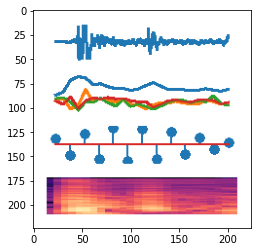

In [ ]:
#mosaic2(arr_gun[0],"Hello1")
X = mos_num(arr_gun[0])
plt.imshow(X)
#plt.imshow(X)

In [ ]:
i = 0
arr_gun = list_iter(energy_threshold,guns_list) #it has all audio shot data for energy threshold.
arr_nogun = list_iter(energy_threshold,noguns_list)#it has all audio non shot data for energy threshold.
for arr in arr_gun:
  mosaic2(arr,os.path.join(SHOT_DIR,str(i)))
  i += 1
print("SHOT MOSAIC DONE")
i = 0
for arr in arr_nogun:
  mosaic2(arr, os.path.join(NO_DIR,str(i)))
  i += 1

NameError: ignored

In [ ]:
#import shutil
#shutil.rmtree(IMG_DIR)

In [ ]:
# This cell is used to find the size of a directory
#import os
#nbytes = sum(d.stat().st_size for d in os.scandir(SHOT_DIR) if d.is_file())
#print(nbytes/(1024*1024))

# Saving mosaic

In [ ]:
i = 0
IMG_WIDTH = 224
IMG_HEIGHT = 224
for arr in arr_shot:
  mosaic2(arr,os.path.join(SHOT_DIR,str(i)),IMG_WIDTH,IMG_HEIGHT)
  i += 1
print("SHOT MOSAIC DONE")
i = 0
for arr in arr_non:
  mosaic2(arr, os.path.join(NO_DIR,str(i)),IMG_WIDTH,IMG_HEIGHT)
  i += 1

In [ ]:
import gc
gc.collect()

In [ ]:
'''#This is part of lPC debug code
files = os.listdir(NO_SHOT)
#faulty = []
i = 0
for arr in arr_non:
  try:
    librosa.lpc(arr,12)
  except:
    i += 1
    #for file_ in files:
    #  if (np.array(energy_threshold(os.path.join(NO_SHOT,file_)),dtype=np.float32) == arr).all():
    #    print(file_)
    #    faulty.append(file_)
    #    break'''

#OLD CONV

##SHUFFLE

### Shuffle Function

In [ ]:
import cv2
from imutils import paths

def cv2_process(imagePath):
  # load the image and resize it to be a fixed 128x128 pixels,
    # ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))

    # add the image to the data lists
    data.append(image)

@time_it
def load_dataset(datasetPath):
  # grab the paths to all images in our dataset directory, then
  # initialize our lists of images
  imagePaths = list(paths.list_images(datasetPath))
  data = []
  # loop over the image paths
  for imagePath in imagePaths:
    
    # load the image and resize it to be a fixed 128x128 pixels,
    # ignoring aspect ratio
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))

    # add the image to the data lists
    data.append(image)

  # return the data list as a NumPy array
  return np.array(data, dtype="float32")

@time_it
def num_images(datasetPath):
  # grab the paths to all images in our dataset directory, then
  # initialize our lists of images
  return len(list(paths.list_images(datasetPath)))

In [ ]:
shuffle = True
FIRE_PATH = '/content/dataset2/shot'
NON_FIRE_PATH = '/content/dataset2/no_shot'
print("[INFO] loading data...")
data = np.vstack([load_dataset( FIRE_PATH), load_dataset( NON_FIRE_PATH)])
print("[INFO] Completed")

[INFO] loading data...
2.7915947437286377 sec(s) for function load_dataset
8.980987548828125 sec(s) for function load_dataset
[INFO] Completed


###Preprocessing And Exploring dataset

In [ ]:
# stack the fire data with the non-fire data, then scale the data
# to the range [0, 1]
labels = np.hstack([np.ones((num_images(FIRE_PATH),)), np.zeros((num_images(NON_FIRE_PATH),))])
#data/=255

0.00885915756225586 sec(s) for function num_images
0.008519172668457031 sec(s) for function num_images


In [ ]:
classTotals = labels.sum(axis=0)
classWeight = classTotals.max() / classTotals

In [ ]:
print(data.shape)
print(labels.shape)
print(labels[1:])
print(classTotals)

(4401, 224, 224, 3)
(4401,)
[1. 1. 1. ... 0. 0. 0.]
1166.0


##### First Split

In [ ]:
TEST_SPLIT = 0.2
(trainX, valX, trainY, valY) = train_test_split(data, labels,test_size= TEST_SPLIT)

In [ ]:
print(trainX.shape)
print(trainY.shape)
print(valX.shape)
print(valY.shape)

(3520, 224, 224, 3)
(3520,)
(881, 224, 224, 3)
(881,)


In [ ]:
del(data)
del(labels)

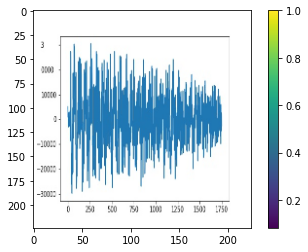

In [ ]:
%matplotlib inline
plt.figure()
plt.imshow(trainX[1]/255)
plt.colorbar()
plt.grid(False)
plt.show()

## Data generator

In [ ]:
class_names=[ "no_shot","shot"]
#datasets = IMG_DIR
shuffle = False
IMG_WIDTH = 224
IMG_HEIGHT = 224
DEPTH = 3
BATCH_SIZE = 32

In [ ]:
data_gen = ImageDataGenerator(
            rescale=1./255,
            validation_split=0.3
            )
# GEt data from directories

In [ ]:
if shuffle is not True:
  
  train_generator = data_gen.flow_from_directory(
          datasets,
          target_size=(IMG_HEIGHT, IMG_WIDTH),
          batch_size=BATCH_SIZE,
          class_mode='sparse',
          shuffle=True,
          color_mode="rgb",
          classes=class_names,
          subset='training')
else:
  train_generator = data_gen.flow(
          trainX, 
          trainY, 
          batch_size=BATCH_SIZE,
          shuffle=True,
  )

Found 3021 images belonging to 2 classes.


In [ ]:
if not shuffle:
  val_generator = data_gen.flow_from_directory(
        datasets,
        target_size=(IMG_HEIGHT, IMG_WIDTH),
        batch_size=BATCH_SIZE,
        class_mode='binary',
        color_mode="rgb",
        classes=class_names,
        subset='validation'
  )
else:
  val_generator = data_gen.flow(
          valX, 
          valY, 
          batch_size=BATCH_SIZE,
          shuffle=True,
  )

Found 1293 images belonging to 2 classes.


In [ ]:
# GEt data from directories
# do not run this block
'''test_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(
          test_pics,
          target_size=(IMG_HEIGHT, IMG_WIDTH),
          class_mode='binary',
          shuffle=True,
          classes=class_names)'''

"test_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(\n          test_pics,\n          target_size=(IMG_HEIGHT, IMG_WIDTH),\n          class_mode='binary',\n          shuffle=True,\n          classes=class_names)"

###Inspect a batch

In [ ]:
from math import ceil,sqrt
def show_batch(image_batch, label_batch, batch_size):
  grid = ceil(sqrt(batch_size))
  plt.figure(figsize=(20,20))
  fire=0
  non = 0
  for n in range(batch_size):
      ax = plt.subplot(grid, grid,n+1)
      plt.imshow(image_batch[n])
      if int(label_batch[n]) == 1:
        fire += 1
      elif int(label_batch[n]) == 0:
        non += 1 
      plt.title(class_names[int(label_batch[n])])
      plt.axis('off')
  print(f"shot = {fire}, non_shot = {non}")

shot = 9, non_shot = 23


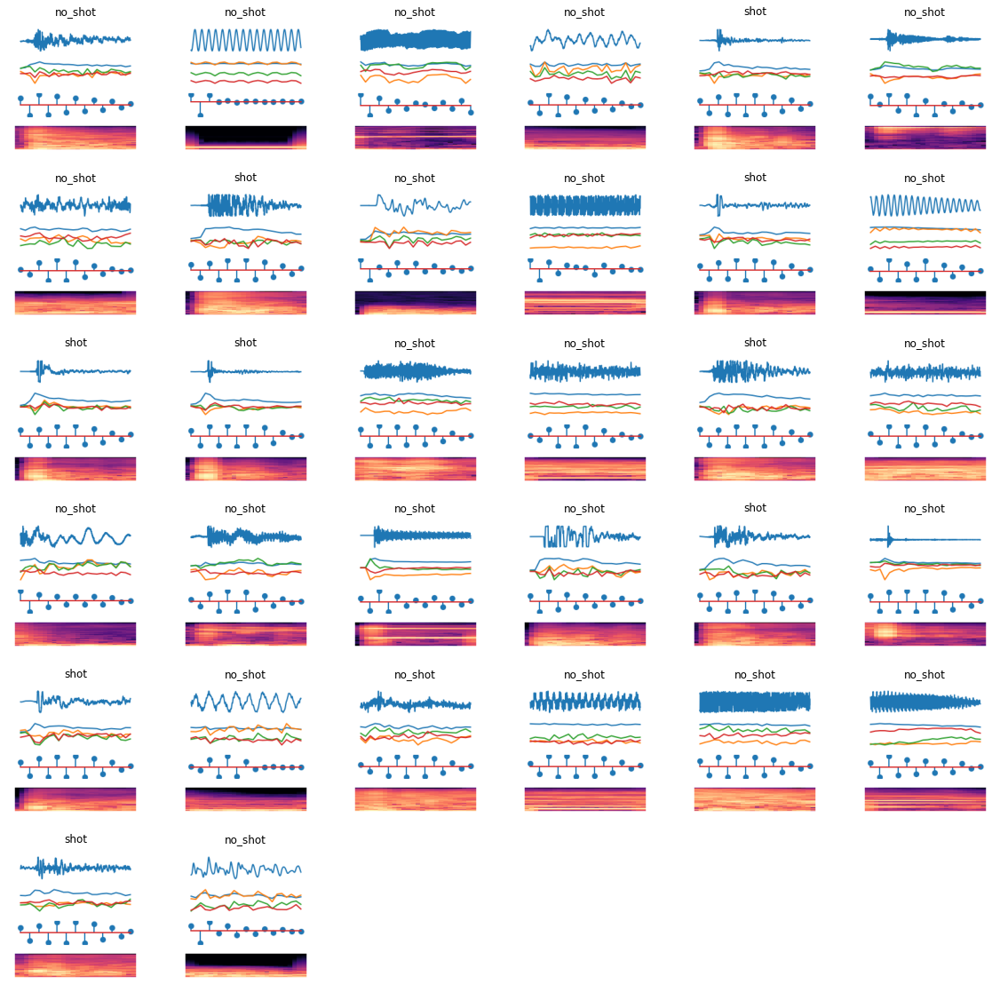

In [ ]:
image_batch, label_batch = next(train_generator)
show_batch(image_batch, label_batch, BATCH_SIZE)

shot = 7, non_shot = 25


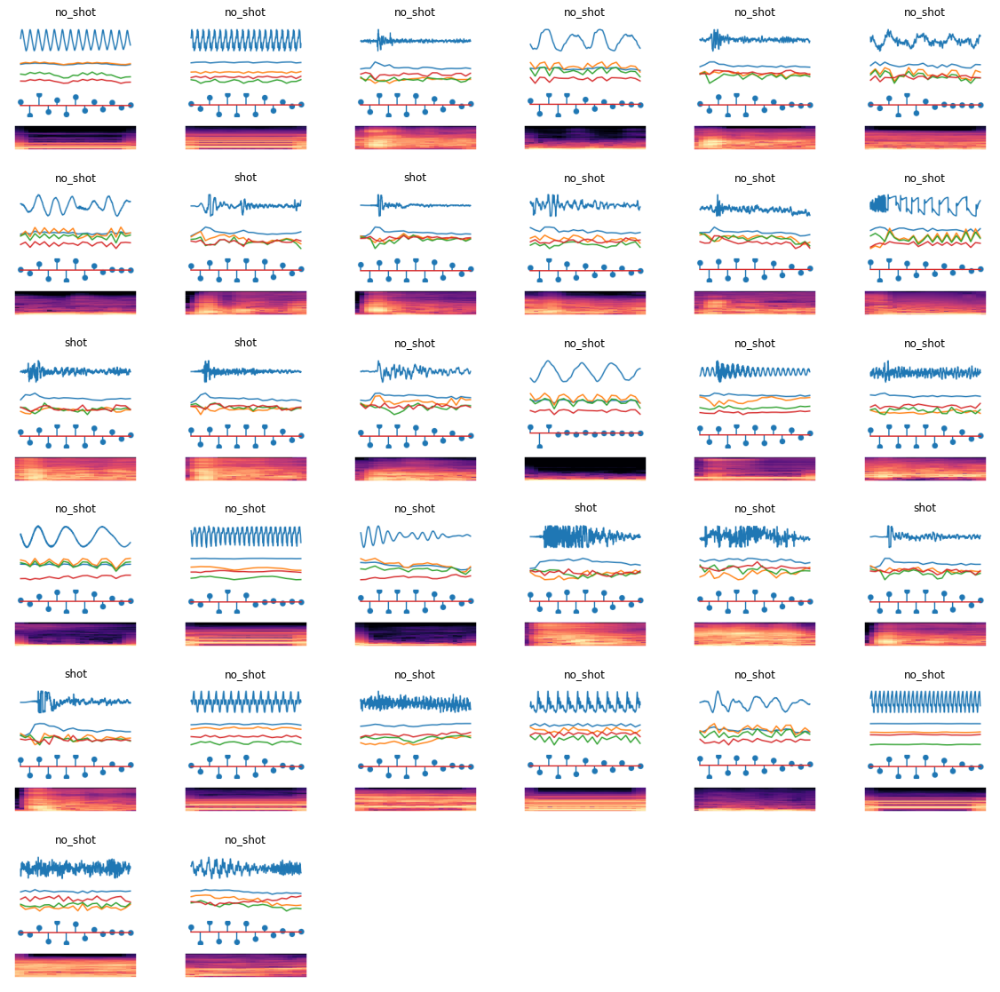

In [ ]:
image_batch, label_batch = next(val_generator)
show_batch(image_batch, label_batch, BATCH_SIZE)

#Modelling

#### Initialization

#### Keras Pretrained Resnet 50


In [ ]:
from tensorflow.keras.applications import ResNet50V2
resnet_model = ResNet50V2(
    include_top=False, #Most important--last layer is not included
    input_tensor=None,
    weights=None,
    input_shape=(IMG_HEIGHT, IMG_WIDTH, DEPTH),
    pooling=None,
    classifier_activation=None,)
resnet_model.trainable = True# freeze the orignianl layers of the resnet model

### Keras Pretrained NASNET Model

In [ ]:
from tensorflow.keras.applications import NASNetMobile
nasnet_model = NASNetMobile(
    include_top=False, #Most important--last layer is not included
    input_tensor=None,
    weights=None,
    input_shape=(IMG_HEIGHT, IMG_WIDTH, DEPTH),
    pooling='max')
nasnet_model.trainable = True

### Keras Pretrained DenseNet Model

In [ ]:
from tensorflow.keras.applications import DenseNet121
densenet_model = DenseNet121(
    include_top=False, #Most important--last layer is not included
    input_tensor=None,
    weights=None,
    input_shape=(IMG_HEIGHT, IMG_WIDTH, DEPTH),
    pooling='max')
#densenet_model.trainable = False# freeze the orignianl layers of the resnet 

### Keras Pretrained MobileNet Model

In [ ]:
from tensorflow.keras.applications import MobileNetV2
mobilenet_model = MobileNetV2(
    include_top=False,
    input_tensor=None,
    weights=None,
    input_shape=(IMG_HEIGHT, IMG_WIDTH, DEPTH),
    pooling='max',
    alpha=1.0)


### Model  Classes

In [ ]:
from tensorflow.keras import Sequential, Model, regularizers
# Various Layers that can be part of the network
from tensorflow.keras.layers import (Conv2D, ZeroPadding2D, Activation, Input,
                                     SeparableConv2D, BatchNormalization,
                                     MaxPooling2D, AveragePooling2D, Lambda,
                                     Flatten, Dense,Dropout,LeakyReLU,Layer,
                                     Layer)
from keras.utils.conv_utils import convert_kernel
import tensorflow.python.keras.backend as K
from keras.layers.merge import concatenate
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
from tensorflow.keras.optimizers import Adam, SGD
import datetime

class TransferLearning():
  def modelrn(self):
    X = resnet_model.layers[-1].output
    X = Flatten()(X)
    #X = Dense(16, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4))(X)
    X = Dense(8, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4))(X)
    X = Dense(1,activation='sigmoid')(X)
    shorter_model = Model(resnet_model.inputs, outputs=X)
    return shorter_model
  def modelnn(self):
    X = nasnet_model.layers[-1].output
    X = Flatten()(X)
    #X = Dense(16, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4))(X)
    X = Dense(8, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4))(X)
    X = Dense(1,activation='sigmoid')(X)
    shorter_model = Model(nasnet_model.inputs, outputs=X)
    return shorter_model
  def modeldn(self):
    X = densenet_model.layers[-1].output
    X = Flatten()(X)
    X = Dense(8, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4))(X)
    X = Dense(1,activation='sigmoid')(X)
    shorter_model = Model(densenet_model.inputs, outputs=X)
    return shorter_model
  def modelmn(self):
      X = mobilenet_model.layers[-1].output
      X = Flatten()(X)
      X = Dense(8, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-4, l2=1e-4))(X)
      X = Dense(2,activation='softmax')(X)
      shorter_model = Model(mobilenet_model.inputs, outputs=X)
      return shorter_model  
  def inception_module(layer_in, f1, f2, f3):
      # 1x1 conv
      conv1 = Conv2D(f1, (1,1), padding='same', activation='relu')(layer_in)
      # 3x3 conv
      conv3 = Conv2D(f2, (3,3), padding='same', activation='relu')(layer_in)
      # 5x5 conv
      conv5 = Conv2D(f3, (5,5), padding='same', activation='relu')(layer_in)
      # 3x3 max pooling
      pool = MaxPooling2D((3,3), strides=(1,1), padding='same')(layer_in)
      # concatenate filters, assumes filters/channels last
      layer_out = concatenate([conv1, conv3, conv5, pool], axis=-1)
      return layer_out
  def separable(self,input_shape):
      my_model = Sequential()
      #BLock 1
      my_model.add(SeparableConv2D(32,(3,1),padding='same',input_shape=input_shape))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(32,(3,1),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(32,(1,1),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(BatchNormalization(axis=-1))
      my_model.add(LeakyReLU())
      my_model.add(MaxPooling2D(pool_size=(2, 1)))
      #Block 2
      my_model.add(SeparableConv2D(32,(1,5),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(32,(1,5),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(32,(1,1),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(BatchNormalization(axis=-1))
      my_model.add(LeakyReLU())
      #my_model.add(MaxPooling2D(pool_size=(1, 4)))
      #block 3
      my_model.add(SeparableConv2D(64,(3,1),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(64,(3,1),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(64,(1,1),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(BatchNormalization(axis=-1))
      my_model.add(LeakyReLU())
      #my_model.add(MaxPooling2D(pool_size=(2, 1)))
      #block 4
      my_model.add(SeparableConv2D(64,(1,5),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(64,(1,5),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(64,(1,1),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(BatchNormalization(axis=-1))
      my_model.add(LeakyReLU())
      #my_model.add(MaxPooling2D(pool_size=(1, 4)))
      #Block 5
      my_model.add(SeparableConv2D(128,(3,5),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(128,(3,5),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(SeparableConv2D(128,(1,1),padding='same'))
      my_model.add(Activation("relu"))
      my_model.add(BatchNormalization(axis=-1))
      my_model.add(LeakyReLU())
      #my_model.add(MaxPooling2D(pool_size=(4, 2)))
      #Flatten
      my_model.add(Flatten())
      my_model.add(Dense(256))
      my_model.add(Activation("relu"))
      my_model.add(Dense(1))
      my_model.add(Activation("sigmoid"))
      return my_model

###GoogleNEt

In [ ]:
class PoolHelper(Layer):

    def __init__(self, **kwargs):
        super(PoolHelper, self).__init__(**kwargs)

    def call(self, x, mask=None):
        return x[:,:,1:,1:]

    def get_config(self):
        config = {}
        base_config = super(PoolHelper, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [ ]:
from tensorflow.keras.backend import square

class LRN(Layer):
    from tensorflow import pad
    def __init__(self, alpha=0.0001, k=1, beta=0.75, n=5, **kwargs):
        self.alpha = alpha
        self.k = k
        self.beta = beta
        self.n = n
        super(LRN, self).__init__(**kwargs)

    def call(self, x, mask=None):
        b, ch, r, c = x.shape
        half_n = self.n // 2 # half the local region
        input_sqr = square(x) # square the input
        input_sqr = pad(input_sqr, [[0, 0], [half_n, half_n], [0, 0], [0, 0]])
        scale = self.k # offset for the scale
        norm_alpha = self.alpha / self.n # normalized alpha
        for i in range(self.n):
            scale += norm_alpha * input_sqr[:, i:i+ch, :, :]
        scale = scale ** self.beta
        x = x / scale
        return x

    def get_config(self):
        config = {"alpha": self.alpha,
                  "k": self.k,
                  "beta": self.beta,
                  "n": self.n}
        base_config = super(LRN, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [ ]:
from tensorflow import Variable
def create_googlenet(weights_path=None,input_shape=(512,512,3)):
    # creates GoogLeNet a.k.a. Inception v1 (Szegedy, 2015)
    input = Input(shape=input_shape)

    input_pad = ZeroPadding2D(padding=(3, 3))(input)
    conv1_7x7_s2 = Conv2D(64, (7,7), strides=(2,2), padding='valid', activation='relu', name='conv1/7x7_s2', kernel_regularizer=regularizers.l2(0.0002))(input_pad)
    conv1_zero_pad = ZeroPadding2D(padding=(1, 1))(conv1_7x7_s2)
    pool1_helper = PoolHelper()(conv1_zero_pad)
    pool1_3x3_s2 = MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid', name='pool1/3x3_s2')(pool1_helper)
    pool1_norm1 = LRN(name='pool1/norm1')(pool1_3x3_s2)

    conv2_3x3_reduce = Conv2D(64, (1,1), padding='same', activation='relu', name='conv2/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(pool1_norm1)
    conv2_3x3 = Conv2D(192, (3,3), padding='same', activation='relu', name='conv2/3x3', kernel_regularizer=regularizers.l2(0.0002))(conv2_3x3_reduce)
    conv2_norm2 = LRN(name='conv2/norm2')(conv2_3x3)
    conv2_zero_pad = ZeroPadding2D(padding=(1, 1))(conv2_norm2)
    pool2_helper = PoolHelper()(conv2_zero_pad)
    pool2_3x3_s2 = MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid', name='pool2/3x3_s2')(pool2_helper)

    inception_3a_1x1 = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_3a/1x1', kernel_regularizer=regularizers.l2(0.0002))(pool2_3x3_s2)
    inception_3a_3x3_reduce = Conv2D(96, (1,1), padding='same', activation='relu', name='inception_3a/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(pool2_3x3_s2)
    inception_3a_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_3a_3x3_reduce)
    inception_3a_3x3 = Conv2D(128, (3,3), padding='valid', activation='relu', name='inception_3a/3x3', kernel_regularizer=regularizers.l2(0.0002))(inception_3a_3x3_pad)
    inception_3a_5x5_reduce = Conv2D(16, (1,1), padding='same', activation='relu', name='inception_3a/5x5_reduce', kernel_regularizer=regularizers.l2(0.0002))(pool2_3x3_s2)
    inception_3a_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_3a_5x5_reduce)
    inception_3a_5x5 = Conv2D(32, (5,5), padding='valid', activation='relu', name='inception_3a/5x5', kernel_regularizer=regularizers.l2(0.0002))(inception_3a_5x5_pad)
    inception_3a_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_3a/pool')(pool2_3x3_s2)
    inception_3a_pool_proj = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_3a/pool_proj', kernel_regularizer=regularizers.l2(0.0002))(inception_3a_pool)
    inception_3a_output = concatenate([inception_3a_1x1,inception_3a_3x3,inception_3a_5x5,inception_3a_pool_proj],axis=-1)

    inception_3b_1x1 = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_3b/1x1', kernel_regularizer=regularizers.l2(0.0002))(inception_3a_output)
    inception_3b_3x3_reduce = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_3b/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_3a_output)
    inception_3b_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_3b_3x3_reduce)
    inception_3b_3x3 = Conv2D(192, (3,3), padding='valid', activation='relu', name='inception_3b/3x3', kernel_regularizer=regularizers.l2(0.0002))(inception_3b_3x3_pad)
    inception_3b_5x5_reduce = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_3b/5x5_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_3a_output)
    inception_3b_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_3b_5x5_reduce)
    inception_3b_5x5 = Conv2D(96, (5,5), padding='valid', activation='relu', name='inception_3b/5x5', kernel_regularizer=regularizers.l2(0.0002))(inception_3b_5x5_pad)
    inception_3b_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_3b/pool')(inception_3a_output)
    inception_3b_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_3b/pool_proj', kernel_regularizer=regularizers.l2(0.0002))(inception_3b_pool)
    inception_3b_output = concatenate([inception_3b_1x1,inception_3b_3x3,inception_3b_5x5,inception_3b_pool_proj],axis=-1, name='inception_3b/output')

    inception_3b_output_zero_pad = ZeroPadding2D(padding=(1, 1))(inception_3b_output)
    pool3_helper = PoolHelper()(inception_3b_output_zero_pad)
    pool3_3x3_s2 = MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid', name='pool3/3x3_s2')(pool3_helper)

    inception_4a_1x1 = Conv2D(192, (1,1), padding='same', activation='relu', name='inception_4a/1x1', kernel_regularizer=regularizers.l2(0.0002))(pool3_3x3_s2)
    inception_4a_3x3_reduce = Conv2D(96, (1,1), padding='same', activation='relu', name='inception_4a/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(pool3_3x3_s2)
    inception_4a_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4a_3x3_reduce)
    inception_4a_3x3 = Conv2D(208, (3,3), padding='valid', activation='relu', name='inception_4a/3x3' ,kernel_regularizer=regularizers.l2(0.0002))(inception_4a_3x3_pad)
    inception_4a_5x5_reduce = Conv2D(16, (1,1), padding='same', activation='relu', name='inception_4a/5x5_reduce', kernel_regularizer=regularizers.l2(0.0002))(pool3_3x3_s2)
    inception_4a_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4a_5x5_reduce)
    inception_4a_5x5 = Conv2D(48, (5,5), padding='valid', activation='relu', name='inception_4a/5x5', kernel_regularizer=regularizers.l2(0.0002))(inception_4a_5x5_pad)
    inception_4a_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4a/pool')(pool3_3x3_s2)
    inception_4a_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_4a/pool_proj', kernel_regularizer=regularizers.l2(0.0002))(inception_4a_pool)
    inception_4a_output = concatenate([inception_4a_1x1,inception_4a_3x3,inception_4a_5x5,inception_4a_pool_proj],axis=-1, name='inception_4a/output')

    loss1_ave_pool = AveragePooling2D(pool_size=(5,5), strides=(3,3), name='loss1/ave_pool')(inception_4a_output)
    loss1_conv = Conv2D(128, (1,1), padding='same', activation='relu', name='loss1/conv', kernel_regularizer=regularizers.l2(0.0002))(loss1_ave_pool)
    loss1_flat = Flatten()(loss1_conv)
    loss1_fc = Dense(1024, activation='relu', name='loss1/fc', kernel_regularizer=regularizers.l2(0.0002))(loss1_flat)
    loss1_drop_fc = Dropout(rate=0.7)(loss1_fc)
    loss1_classifier = Dense(1000, name='loss1/classifier', kernel_regularizer=regularizers.l2(0.0002))(loss1_drop_fc)
    loss1_classifier_act = Activation('softmax')(loss1_classifier)

    inception_4b_1x1 = Conv2D(160, (1,1), padding='same', activation='relu', name='inception_4b/1x1', kernel_regularizer=regularizers.l2(0.0002))(inception_4a_output)
    inception_4b_3x3_reduce = Conv2D(112, (1,1), padding='same', activation='relu', name='inception_4b/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_4a_output)
    inception_4b_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4b_3x3_reduce)
    inception_4b_3x3 = Conv2D(224, (3,3), padding='valid', activation='relu', name='inception_4b/3x3', kernel_regularizer=regularizers.l2(0.0002))(inception_4b_3x3_pad)
    inception_4b_5x5_reduce = Conv2D(24, (1,1), padding='same', activation='relu', name='inception_4b/5x5_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_4a_output)
    inception_4b_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4b_5x5_reduce)
    inception_4b_5x5 = Conv2D(64, (5,5), padding='valid', activation='relu', name='inception_4b/5x5', kernel_regularizer=regularizers.l2(0.0002))(inception_4b_5x5_pad)
    inception_4b_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4b/pool')(inception_4a_output)
    inception_4b_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_4b/pool_proj', kernel_regularizer=regularizers.l2(0.0002))(inception_4b_pool)
    inception_4b_output = concatenate([inception_4b_1x1,inception_4b_3x3,inception_4b_5x5,inception_4b_pool_proj],axis=-1, name='inception_4b/output')

    inception_4c_1x1 = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_4c/1x1', kernel_regularizer=regularizers.l2(0.0002))(inception_4b_output)
    inception_4c_3x3_reduce = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_4c/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_4b_output)
    inception_4c_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4c_3x3_reduce)
    inception_4c_3x3 = Conv2D(256, (3,3), padding='valid', activation='relu', name='inception_4c/3x3', kernel_regularizer=regularizers.l2(0.0002))(inception_4c_3x3_pad)
    inception_4c_5x5_reduce = Conv2D(24, (1,1), padding='same', activation='relu', name='inception_4c/5x5_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_4b_output)
    inception_4c_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4c_5x5_reduce)
    inception_4c_5x5 = Conv2D(64, (5,5), padding='valid', activation='relu', name='inception_4c/5x5', kernel_regularizer=regularizers.l2(0.0002))(inception_4c_5x5_pad)
    inception_4c_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4c/pool')(inception_4b_output)
    inception_4c_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_4c/pool_proj', kernel_regularizer=regularizers.l2(0.0002))(inception_4c_pool)
    inception_4c_output = concatenate([inception_4c_1x1,inception_4c_3x3,inception_4c_5x5,inception_4c_pool_proj],axis=-1, name='inception_4c/output')

    inception_4d_1x1 = Conv2D(112, (1,1), padding='same', activation='relu', name='inception_4d/1x1', kernel_regularizer=regularizers.l2(0.0002))(inception_4c_output)
    inception_4d_3x3_reduce = Conv2D(144, (1,1), padding='same', activation='relu', name='inception_4d/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_4c_output)
    inception_4d_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4d_3x3_reduce)
    inception_4d_3x3 = Conv2D(288, (3,3), padding='valid', activation='relu', name='inception_4d/3x3', kernel_regularizer=regularizers.l2(0.0002))(inception_4d_3x3_pad)
    inception_4d_5x5_reduce = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_4d/5x5_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_4c_output)
    inception_4d_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4d_5x5_reduce)
    inception_4d_5x5 = Conv2D(64, (5,5), padding='valid', activation='relu', name='inception_4d/5x5', kernel_regularizer=regularizers.l2(0.0002))(inception_4d_5x5_pad)
    inception_4d_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4d/pool')(inception_4c_output)
    inception_4d_pool_proj = Conv2D(64, (1,1), padding='same', activation='relu', name='inception_4d/pool_proj', kernel_regularizer=regularizers.l2(0.0002))(inception_4d_pool)
    inception_4d_output = concatenate([inception_4d_1x1,inception_4d_3x3,inception_4d_5x5,inception_4d_pool_proj],axis=-1, name='inception_4d/output')

    loss2_ave_pool = AveragePooling2D(pool_size=(5,5), strides=(3,3), name='loss2/ave_pool')(inception_4d_output)
    loss2_conv = Conv2D(128, (1,1), padding='same', activation='relu', name='loss2/conv', kernel_regularizer=regularizers.l2(0.0002))(loss2_ave_pool)
    loss2_flat = Flatten()(loss2_conv)
    loss2_fc = Dense(1024, activation='relu', name='loss2/fc', kernel_regularizer=regularizers.l2(0.0002))(loss2_flat)
    loss2_drop_fc = Dropout(rate=0.7)(loss2_fc)
    loss2_classifier = Dense(1000, name='loss2/classifier', kernel_regularizer=regularizers.l2(0.0002))(loss2_drop_fc)
    loss2_classifier_act = Activation('softmax')(loss2_classifier)

    inception_4e_1x1 = Conv2D(256, (1,1), padding='same', activation='relu', name='inception_4e/1x1', kernel_regularizer=regularizers.l2(0.0002))(inception_4d_output)
    inception_4e_3x3_reduce = Conv2D(160, (1,1), padding='same', activation='relu', name='inception_4e/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_4d_output)
    inception_4e_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_4e_3x3_reduce)
    inception_4e_3x3 = Conv2D(320, (3,3), padding='valid', activation='relu', name='inception_4e/3x3', kernel_regularizer=regularizers.l2(0.0002))(inception_4e_3x3_pad)
    inception_4e_5x5_reduce = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_4e/5x5_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_4d_output)
    inception_4e_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_4e_5x5_reduce)
    inception_4e_5x5 = Conv2D(128, (5,5), padding='valid', activation='relu', name='inception_4e/5x5', kernel_regularizer=regularizers.l2(0.0002))(inception_4e_5x5_pad)
    inception_4e_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_4e/pool')(inception_4d_output)
    inception_4e_pool_proj = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_4e/pool_proj', kernel_regularizer=regularizers.l2(0.0002))(inception_4e_pool)
    inception_4e_output = concatenate([inception_4e_1x1,inception_4e_3x3,inception_4e_5x5,inception_4e_pool_proj],axis=-1, name='inception_4e/output')

    inception_4e_output_zero_pad = ZeroPadding2D(padding=(1, 1))(inception_4e_output)
    pool4_helper = PoolHelper()(inception_4e_output_zero_pad)
    pool4_3x3_s2 = MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid', name='pool4/3x3_s2')(pool4_helper)

    inception_5a_1x1 = Conv2D(256, (1,1), padding='same', activation='relu', name='inception_5a/1x1', kernel_regularizer=regularizers.l2(0.0002))(pool4_3x3_s2)
    inception_5a_3x3_reduce = Conv2D(160, (1,1), padding='same', activation='relu', name='inception_5a/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(pool4_3x3_s2)
    inception_5a_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_5a_3x3_reduce)
    inception_5a_3x3 = Conv2D(320, (3,3), padding='valid', activation='relu', name='inception_5a/3x3', kernel_regularizer=regularizers.l2(0.0002))(inception_5a_3x3_pad)
    inception_5a_5x5_reduce = Conv2D(32, (1,1), padding='same', activation='relu', name='inception_5a/5x5_reduce', kernel_regularizer=regularizers.l2(0.0002))(pool4_3x3_s2)
    inception_5a_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_5a_5x5_reduce)
    inception_5a_5x5 = Conv2D(128, (5,5), padding='valid', activation='relu', name='inception_5a/5x5', kernel_regularizer=regularizers.l2(0.0002))(inception_5a_5x5_pad)
    inception_5a_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_5a/pool')(pool4_3x3_s2)
    inception_5a_pool_proj = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_5a/pool_proj', kernel_regularizer=regularizers.l2(0.0002))(inception_5a_pool)
    inception_5a_output = concatenate([inception_5a_1x1,inception_5a_3x3,inception_5a_5x5,inception_5a_pool_proj],axis=-1, name='inception_5a/output')

    inception_5b_1x1 = Conv2D(384, (1,1), padding='same', activation='relu', name='inception_5b/1x1', kernel_regularizer=regularizers.l2(0.0002))(inception_5a_output)
    inception_5b_3x3_reduce = Conv2D(192, (1,1), padding='same', activation='relu', name='inception_5b/3x3_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_5a_output)
    inception_5b_3x3_pad = ZeroPadding2D(padding=(1, 1))(inception_5b_3x3_reduce)
    inception_5b_3x3 = Conv2D(384, (3,3), padding='valid', activation='relu', name='inception_5b/3x3', kernel_regularizer=regularizers.l2(0.0002))(inception_5b_3x3_pad)
    inception_5b_5x5_reduce = Conv2D(48, (1,1), padding='same', activation='relu', name='inception_5b/5x5_reduce', kernel_regularizer=regularizers.l2(0.0002))(inception_5a_output)
    inception_5b_5x5_pad = ZeroPadding2D(padding=(2, 2))(inception_5b_5x5_reduce)
    inception_5b_5x5 = Conv2D(128, (5,5), padding='valid', activation='relu', name='inception_5b/5x5', kernel_regularizer=regularizers.l2(0.0002))(inception_5b_5x5_pad)
    inception_5b_pool = MaxPooling2D(pool_size=(3,3), strides=(1,1), padding='same', name='inception_5b/pool')(inception_5a_output)
    inception_5b_pool_proj = Conv2D(128, (1,1), padding='same', activation='relu', name='inception_5b/pool_proj', kernel_regularizer=regularizers.l2(0.0002))(inception_5b_pool)
    inception_5b_output = concatenate([inception_5b_1x1,inception_5b_3x3,inception_5b_5x5,inception_5b_pool_proj],axis=-1, name='inception_5b/output')

    pool5_7x7_s1 = AveragePooling2D(pool_size=(7,7), strides=(1,1), name='pool5/7x7_s2')(inception_5b_output)
    loss3_flat = Flatten()(pool5_7x7_s1)
    pool5_drop_7x7_s1 = Dropout(rate=0.4)(loss3_flat)
    loss3_classifier = Dense(1000, name='loss3/classifier', kernel_regularizer=regularizers.l2(0.0002))(pool5_drop_7x7_s1)
    loss3_classifier_act = Activation('softmax', name='prob')(loss3_classifier)

    googlenet = Model(inputs=input, outputs=[loss1_classifier_act,loss2_classifier_act,loss3_classifier_act])

    if weights_path:
        googlenet.load_weights(weights_path)


    return googlenet

###Compile

In [ ]:
my_model = TransferLearning()
my_model = my_model.modeldn()
#my_model = create_googlenet()
#my_model.summary()
my_model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
mc = ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', 
                     save_best_only=True)
callback_list = []
callback_list.append(mc)
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tb = TensorBoard(log_dir=log_dir, histogram_freq=1)
callback_list.append(tb)
my_model.summary()

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_10 (ZeroPadding2 (None, 230, 230, 3)  0           input_6[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_10[0][0]          
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

In [ ]:
len(my_model.layers)

431

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
!rm -rf ./logs/   

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
EPOCHS = 20
history = my_model.fit(
    x=train_generator,
    validation_data = val_generator, 
    epochs = EPOCHS,
    callbacks= callback_list,
    #class_weight = classWeight
    )

Epoch 1/20
 1/95 [..............................] - ETA: 17s - loss: 0.0096 - accuracy: 1.0000WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
95/95 [==============================] - 37s 392ms/step - loss: 0.0081 - accuracy: 0.9980 - val_loss: 0.0424 - val_accuracy: 0.9884
Epoch 2/20
95/95 [==============================] - 36s 382ms/step - loss: 0.0112 - accuracy: 0.9960 - val_loss: 0.1962 - val_accuracy: 0.9374
Epoch 3/20
95/95 [==============================] - 37s 385ms/step - loss: 0.0178 - accuracy: 0.9954 - val_loss: 0.0713 - val_accuracy: 0.9853
Epoch 4/20
95/95 [==============================] - 38s 399ms/step - loss: 0.0108 - accuracy: 0.9977 - val_loss: 0.0405 - val_accuracy: 0.9899
Epoch 5/20
95/95 [==============================] - 37s 391ms/step 

KeyboardInterrupt: ignored

###Tensor Board

In [ ]:
tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

###Saving Models


In [ ]:
import os
import shutil
base = os.getcwd()
wfd=os.path.join(base,'/content/drive/My Drive/Final Year Project/weights/mosaic')
#name = 'dense_train_%0.5f_val_%0.5f.h5' %(history.history["accuracy"][-1],
#                                              history.history["val_accuracy"][-1])
name = 'dense_train_99.79_val_99.38.h5'
#my_model.save(name, overwrite=True)
shutil.move(name,wfd)

'/content/drive/My Drive/Final Year Project/weights/mosaic/dense_train_99.79_val_99.38.h5'

In [ ]:
my_model = load_model('/content/drive/MyDrive/Final Year Project/weights/mosaic/dense_train_99.79_val_99.38.h5')

In [ ]:
from sklearn.metrics import classification_report
predictions = []
for i in my_model.predict(val_generator):
	if i[0] >0.8:
		predictions.append(1)
	else:
		predictions.append(0)
print(classification_report(val_generator.labels, predictions, target_names= class_names))

              precision    recall  f1-score   support

     no_shot       0.71      0.72      0.71       944
        shot       0.23      0.23      0.23       349

    accuracy                           0.58      1293
   macro avg       0.47      0.47      0.47      1293
weighted avg       0.58      0.58      0.58      1293



In [ ]:
my_model.evaluate(val_generator)

41/41 [==============================] - 4s 90ms/step - loss: 0.0324 - accuracy: 0.9938


{'accuracy': 0.9938128590583801, 'loss': 0.03237484022974968}

In [ ]:
#Confusion Matrix
from sklearn.metrics import confusion_matrix
tn,fp,fn,tp=confusion_matrix(val_generator.labels,predictions).ravel()
print("\tPred_No\tPred_Gun")
print(f"Act_No\t{tn}\t{fp}")
print(f"Act_Gun\t{fn}\t{tp}")

	P_No	P_Gun
A_No	774	21
A_Gun	0	241


In [ ]:
my_model.evaluate(x=testdata,y=labels)

5/5 [==============================] - 0s 26ms/step - loss: 4.8441 - accuracy: 0.2500


[4.84407377243042, 0.25]

#Testing 

In [ ]:
# get directory names
direcs = []
for direc in direcs:
    arrs = dir_iter(energy_threshold,direc[0])
    if direc[1]:
      labels = np.ones(arrs.shape[0])
    else:
      labels = np.zeros(arrs.shape[0])
    mosaics = []
    for arr in arrs:
      X = mos_num(arr)
      if X is not None:
        mosaics.append(X)
      else:
        continue
    my_model.predict(mosaics)